In [2]:
%pylab inline
import time
import sys
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import torchvision
from torchvision import transforms

from PIL import Image
from collections import OrderedDict

import os 
# the directory of the images and models
style_dir = os.getcwd() + '/Images/style/'
content_dir = os.getcwd() + '/Images/content/'
model_dir = os.getcwd() + '/Models/'


Populating the interactive namespace from numpy and matplotlib


# Feature Extraction

In style transfer, we need to define the style loss and content loss on the features (output) of specific layers. Here we define a nn based on vgg19 with a forward function returning the output of selected layers.

In [3]:
# a class of vgg nn which allows picking up output (features) of single layers
class style_trans_vgg(nn.Module):
    def __init__(self, pool='avg'):
        super(style_trans_vgg, self).__init__()
        #vgg modules
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_4 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_4 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        if pool == 'max':
            self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)
        elif pool == 'avg':
            self.pool1 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool2 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool3 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool4 = nn.AvgPool2d(kernel_size=2, stride=2)
            self.pool5 = nn.AvgPool2d(kernel_size=2, stride=2)
            
    def forward(self, x, out_keys):
        out = {}
        out['r11'] = F.relu(self.conv1_1(x))
        out['r12'] = F.relu(self.conv1_2(out['r11']))
        out['p1'] = self.pool1(out['r12'])
        out['r21'] = F.relu(self.conv2_1(out['p1']))
        out['r22'] = F.relu(self.conv2_2(out['r21']))
        out['p2'] = self.pool2(out['r22'])
        out['r31'] = F.relu(self.conv3_1(out['p2']))
        out['r32'] = F.relu(self.conv3_2(out['r31']))
        out['r33'] = F.relu(self.conv3_3(out['r32']))
        out['r34'] = F.relu(self.conv3_4(out['r33']))
        out['p3'] = self.pool3(out['r34'])
        out['r41'] = F.relu(self.conv4_1(out['p3']))
        out['r42'] = F.relu(self.conv4_2(out['r41']))
        out['r43'] = F.relu(self.conv4_3(out['r42']))
        out['r44'] = F.relu(self.conv4_4(out['r43']))
        out['p4'] = self.pool4(out['r44'])
        out['r51'] = F.relu(self.conv5_1(out['p4']))
        out['r52'] = F.relu(self.conv5_2(out['r51']))
        out['r53'] = F.relu(self.conv5_3(out['r52']))
        out['r54'] = F.relu(self.conv5_4(out['r53']))
        out['p5'] = self.pool5(out['r54'])
        return [out[key] for key in out_keys]

# Gram Matrix and Style Loss

The equation of the Gram matrix and style loss are given below:

\begin{equation*}
G_{ij}^l = \sum_k F_{ik}^l F_{jk}^l
\end{equation*}

\begin{equation*}
E_l = \frac{1}{4 N_{l}^2 M_{l}^2}\sum_ij (G_{ij}^l - A_{ij}^l)^2
\end{equation*}

In [4]:
# gram matrix and loss
class GramMatrix(nn.Module):
    def forward(self, input):
        
        # b: number of batch
        # c: number of channel (feature)
        # h and w: height and width of the tensor
        b,c,h,w = input.size()
        
        # compute the gram matrix
        F = input.view(b, c, h*w)
        G = torch.bmm(F, F.transpose(1,2)) 
        
        # divide the gram matrix by the number of channel
        # and feature map size
        G.div_(c*h*w)
        return G

class GramMSELoss(nn.Module):
    def forward(self, input, target):
        out = nn.MSELoss()(GramMatrix()(input), target)
        return(out)

# Image Preprocessing and Postprocessing



In [5]:
def img_preprocess(img_name, imgsize=512):
    prep_loader = transforms.Compose([transforms.Resize(imgsize),
                           transforms.ToTensor(),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to BGR
                           transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], #subtract imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x.mul_(255)),
                          ])
    img = Image.open(img_name)
    img = prep_loader(img).unsqueeze(0) # adding the dimension of batch
    if torch.cuda.is_available():
        return img.cuda().requires_grad_()
    else:
        return img.requires_grad_()

def img_postprocess(img_tensor):
    postp_loader1 = transforms.Compose([transforms.Lambda(lambda x: x.mul_(1./255)),
                           transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], #add imagenet mean
                                                std=[1,1,1]),
                           transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])]), #turn to RGB
                           ])
    postp_loader2 = transforms.Compose([transforms.ToPILImage()])
    temp = postp_loader1(img_tensor)
    temp[temp>1] = 1    
    temp[temp<0] = 0
    img = postp_loader2(temp)
    return img

# Get arguments for experiments

In [6]:
def get_vgg(model_dir,pool_mod='avg'):
    vgg = style_trans_vgg(pool_mod)
    vgg.load_state_dict(torch.load(model_dir + 'vgg_conv.pth'))
    for param in vgg.parameters():
        param.requires_grad = False
    if torch.cuda.is_available():
        vgg.cuda()
        
    return vgg

def get_img_dir(style_dir, content_dir, style_name, content_name):
    img_dirs = [style_dir, content_dir]
    img_names = [style_name, content_name]
    img_dir_names = [(img_dirs[i] + name) for i,name in enumerate(img_names)]
    imgs = [Image.open(img_name) for img_name in img_dir_names]
    imgs_torch = [img_preprocess(img_name) for img_name in img_dir_names]
    
    style_img, content_img = imgs_torch
    
    #display images
    plt.figure()
    imshow(imgs[0])
    title("Style Image")
    
    plt.figure()
    imshow(imgs[1])
    title("Content Image")
    
    return style_img, content_img

def get_optimizer(content_img):
    opt_img = content_img.data.clone().requires_grad_()
    optimizer = optim.LBFGS([opt_img])
    
    return opt_img, optimizer

# Style Transfer Experiments

In [7]:
# apply style transfer
def style_trans(model, optimizer, opt_img, style_img, content_img, 
                style_layers=['r11','r21','r31','r41', 'r51'], content_layers=['r42'],
               style_weight=1e3, content_weight=1, max_iter=300, show_iter=50, disp_iter_loss=True):
   
    loss_layers = style_layers + content_layers
    loss_fns = [GramMSELoss()] * len(style_layers) + [nn.MSELoss()] * len(content_layers)
    if torch.cuda.is_available():
        loss_fns = [loss_fn.cuda() for loss_fn in loss_fns]
        
    style_weights = [style_weight/len(style_layers)]*len(style_layers)
    content_weights = [content_weight/len(content_layers)]*len(content_layers)
    weights = style_weights + content_weights
    
    #compute optimization targets
    style_targets = [GramMatrix()(A).detach() for A in model(style_img, style_layers)]
    content_targets = [A.detach() for A in model(content_img, content_layers)]
    targets = style_targets + content_targets
    
    n_iter=[0]
    
    while n_iter[0] <= max_iter:

        def closure():
            optimizer.zero_grad()
            out = model(opt_img, loss_layers)
            layer_losses = [weights[a] * loss_fns[a](A, targets[a]) for a,A in enumerate(out)]
            loss = sum(layer_losses)
            loss.backward()

            n_iter[0]+=1
            if disp_iter_loss==True:
                if n_iter[0]%show_iter == (show_iter-1):
                    print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.item()))
        #             print([loss_layers[li] + ': ' +  str(l.data[0]) for li,l in enumerate(layer_losses)]) #loss of each layer
            return loss

        optimizer.step(closure)

# display a output style transfered image
def style_trans_disp(opt_img):
    #display result
    out_img = img_postprocess(opt_img.data[0].cpu().squeeze())
    plt.figure()
    imshow(out_img)
    title("Style Transfered")
    gcf().set_size_inches(10,10)

# single experiment of style transfer
def style_trans_simple_exp(model_dir, style_dir, content_dir, 
                            pool_mod='avg', style_name="starry-night.jpg", 
                            content_name="Tuebingen_Neckarfront.jpg",
                            Style_Layers=['r11','r21','r31','r41', 'r51'], Content_Layers = ['r42'],
                            Style_Weight=1e6, Content_Weight=1, Max_Iter=300, Show_Iter=50):
    vgg = get_vgg(model_dir,pool_mod)
    style_img, content_img = get_img_dir(style_dir, content_dir, style_name, content_name)
    opt_img, optimizer = get_optimizer(content_img)
    style_trans(vgg, optimizer, opt_img, style_img, content_img, style_layers=Style_Layers, 
                content_layers=Content_Layers,style_weight=Style_Weight, 
                content_weight=Content_Weight, max_iter=Max_Iter, show_iter=Show_Iter)
    style_trans_disp(opt_img)

# comparison experiment of style transfer
def style_trans_compare_exp(model_dir, style_dir, content_dir, 
                            pool_mod='avg', style_name="starry-night.jpg", 
                            content_name="Tuebingen_Neckarfront.jpg",
                            Style_Layers=['r11','r21','r31','r41', 'r51'], Content_Layers = ['r42'],
                            Max_Iter=300, Show_Iter=50):
    
    # recording time
    start = time.time()
    
    vgg = get_vgg(model_dir,pool_mod)
    style_img, content_img = get_img_dir(style_dir, content_dir, style_name, content_name)
    
    transfered_img = [] 
    Content_Weight=1
    fig, axes = plt.subplots(ncols=4, nrows=len(Style_Layers), figsize=(22,18))
    
    # transfer all the img while changing the style layers and alpha-beta ratio
    for i in range(4*len(Style_Layers)):
        
        opt_img, optimizer = get_optimizer(content_img)
        style_trans(vgg, optimizer, opt_img, style_img, content_img, style_layers=Style_Layers[:i//4+1], 
                    content_layers=Content_Layers,style_weight=10**(3+i%4), content_weight=Content_Weight, 
                    max_iter=Max_Iter, show_iter=Show_Iter,disp_iter_loss=False)
        
        transfered_img.append(opt_img)
        
        out_img = img_postprocess(opt_img.data[0].cpu().squeeze())
        axes[i//4][i%4].imshow(out_img)
        if i//4 == 0:
            axes[i//4][i%4].set_title('10^{}'.format(-(3+i%4)))
        if i%4 == 0:
            axes[i//4][i%4].set(ylabel=Style_Layers[i//4])
            
        # record time
        a_loop = time.time()
        print('Time consumed: {}'.format(a_loop-start))
        
    plt.tight_layout()
    fig.canvas.draw()
    
    

# Exp 1 - Starry Night

Iteration: 50, loss: 4276863.000000
Iteration: 100, loss: 980382.625000
Iteration: 150, loss: 473475.187500
Iteration: 200, loss: 312650.593750
Iteration: 250, loss: 241584.468750
Iteration: 300, loss: 202851.656250


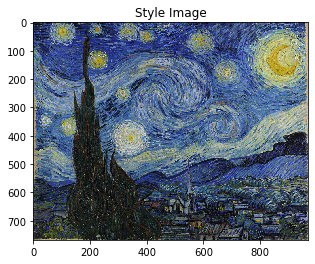

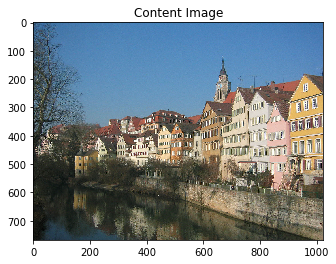

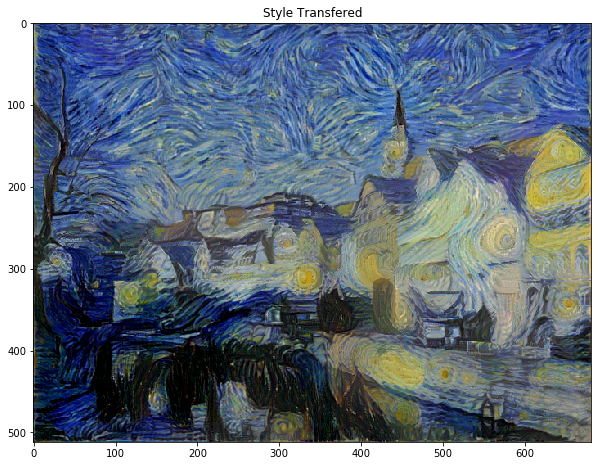

In [9]:
style_trans_simple_exp(model_dir, style_dir, content_dir)

# Exp 2 - Seated Nude

Iteration: 50, loss: 22522898.000000
Iteration: 100, loss: 2456878.000000
Iteration: 150, loss: 1075760.250000
Iteration: 200, loss: 654162.125000
Iteration: 250, loss: 462244.031250
Iteration: 300, loss: 355008.437500


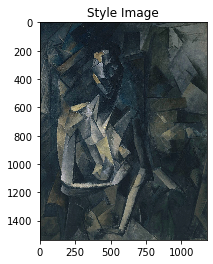

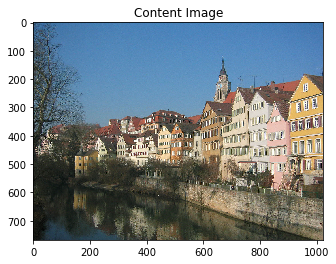

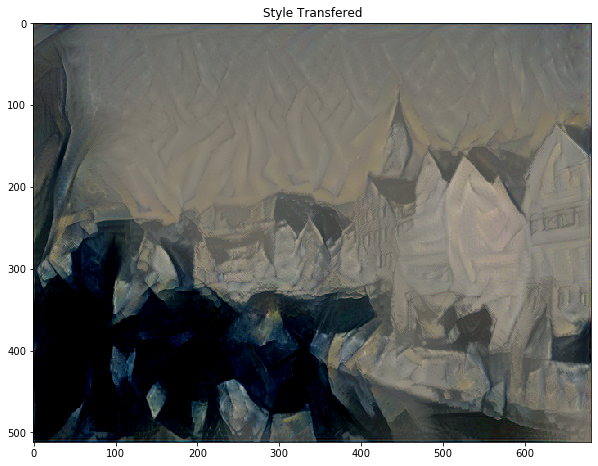

In [10]:
style_trans_simple_exp(model_dir, style_dir, content_dir, 
                       style_name="seated-nude.jpg", content_name="Tuebingen_Neckarfront.jpg")

# Exp 3 - The Scream

Iteration: 50, loss: 62336280.000000
Iteration: 100, loss: 12843236.000000
Iteration: 150, loss: 4490254.500000
Iteration: 200, loss: 2242706.500000
Iteration: 250, loss: 1454485.000000
Iteration: 300, loss: 1064718.125000


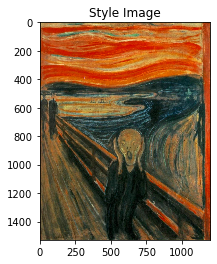

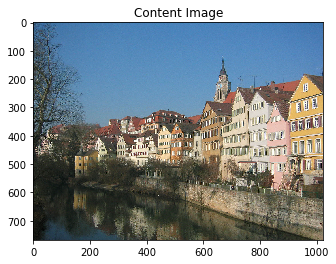

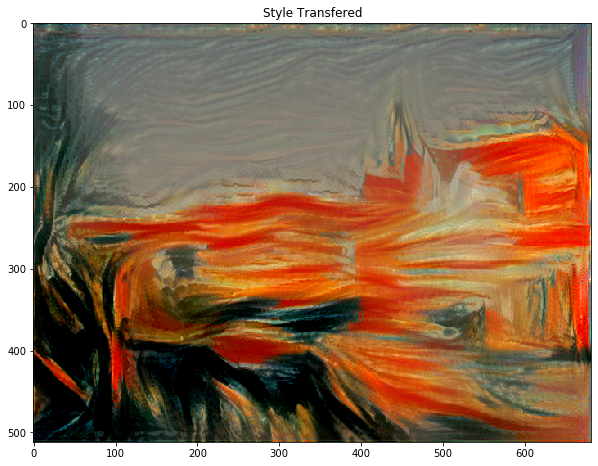

In [11]:
style_trans_simple_exp(model_dir, style_dir, content_dir, 
                       style_name="the-scream.jpg", content_name="Tuebingen_Neckarfront.jpg")

# Exp 4 - The Shipwreck of The Minotaur

Iteration: 50, loss: 1074315.250000
Iteration: 100, loss: 303921.875000
Iteration: 150, loss: 167121.031250
Iteration: 200, loss: 120337.171875
Iteration: 250, loss: 99802.593750
Iteration: 300, loss: 87780.984375


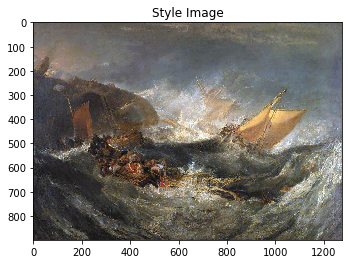

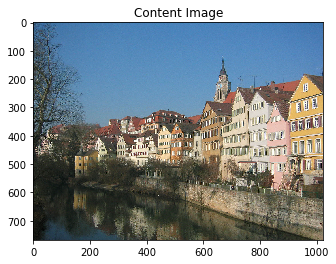

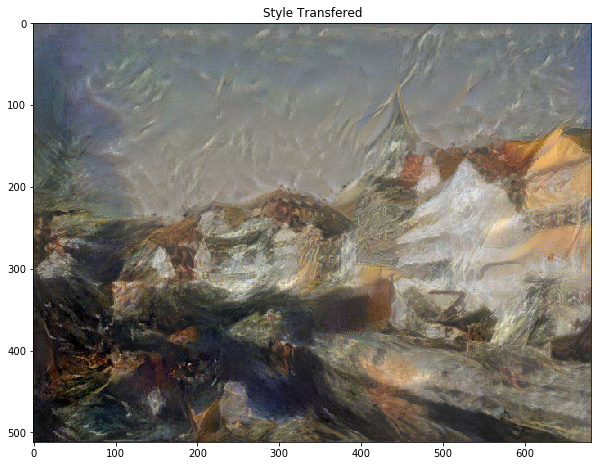

In [12]:
style_trans_simple_exp(model_dir, style_dir, content_dir, 
                       style_name="the-shipwreck-of-the-minotaur.jpg", content_name="Tuebingen_Neckarfront.jpg")

# Exp 5 - La Muse

Iteration: 50, loss: 24177944.000000
Iteration: 100, loss: 7232076.500000
Iteration: 150, loss: 3751369.250000
Iteration: 200, loss: 2468411.750000
Iteration: 250, loss: 1824836.750000
Iteration: 300, loss: 1450130.500000


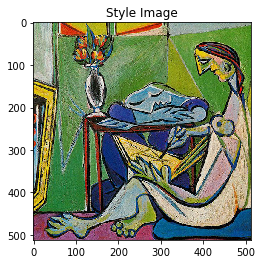

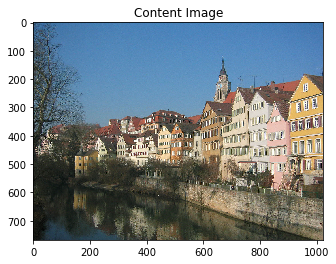

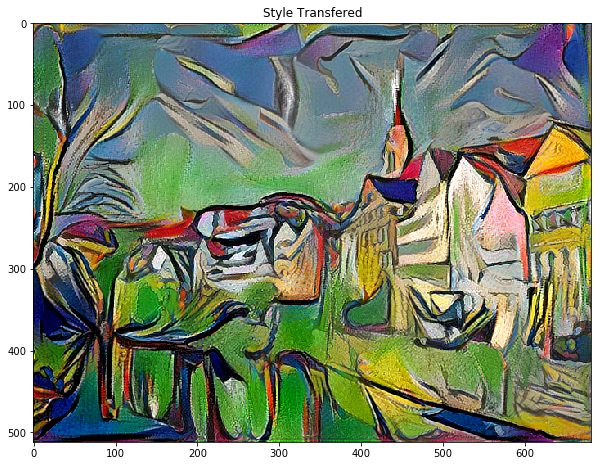

In [13]:
style_trans_simple_exp(model_dir, style_dir, content_dir, 
                       style_name="la_muse.jpg", content_name="Tuebingen_Neckarfront.jpg")

# Exp 6 - Max-pooling vs. Average-pooling

Iteration: 50, loss: 199946560.000000
Iteration: 100, loss: 96004528.000000
Iteration: 150, loss: 52853696.000000
Iteration: 200, loss: 29500566.000000
Iteration: 250, loss: 16408556.000000
Iteration: 300, loss: 9270552.000000


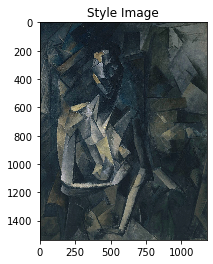

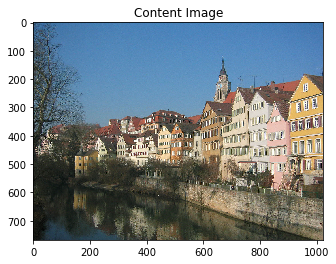

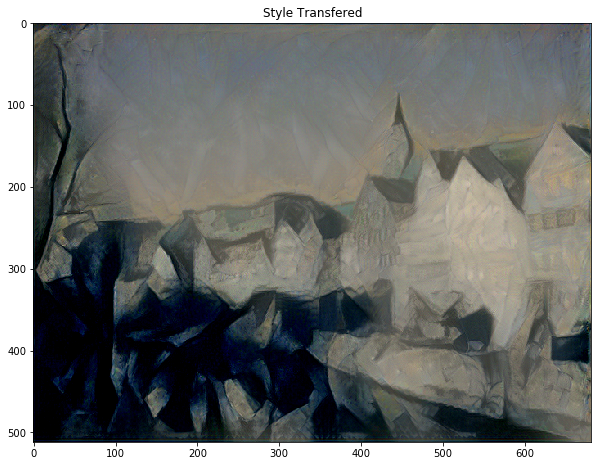

In [8]:
style_trans_simple_exp(model_dir, style_dir, content_dir, pool_mod='max',
                       style_name="seated-nude.jpg", content_name="Tuebingen_Neckarfront.jpg")

Iteration: 50, loss: 669586496.000000
Iteration: 100, loss: 264175600.000000
Iteration: 150, loss: 129695256.000000
Iteration: 200, loss: 73913856.000000
Iteration: 250, loss: 46934212.000000
Iteration: 300, loss: 31961478.000000


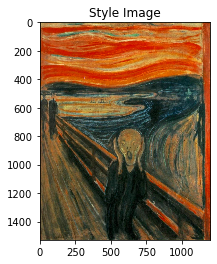

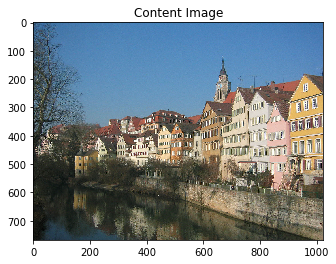

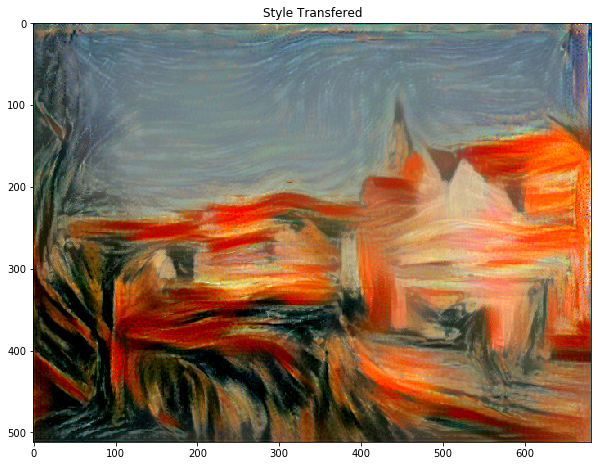

In [9]:
style_trans_simple_exp(model_dir, style_dir, content_dir, pool_mod='max',
                       style_name="the-scream.jpg", content_name="Tuebingen_Neckarfront.jpg")

Iteration: 50, loss: 70230192.000000
Iteration: 100, loss: 11386090.000000
Iteration: 150, loss: 4581060.000000
Iteration: 200, loss: 2651447.750000
Iteration: 250, loss: 1870676.250000
Iteration: 300, loss: 1458217.625000


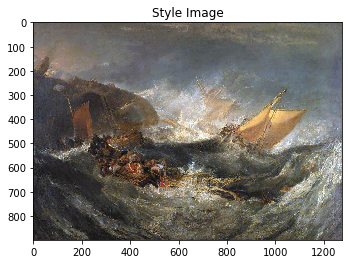

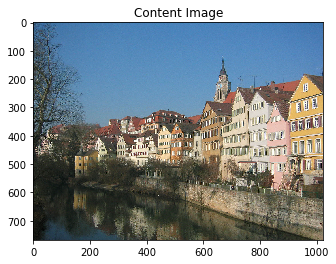

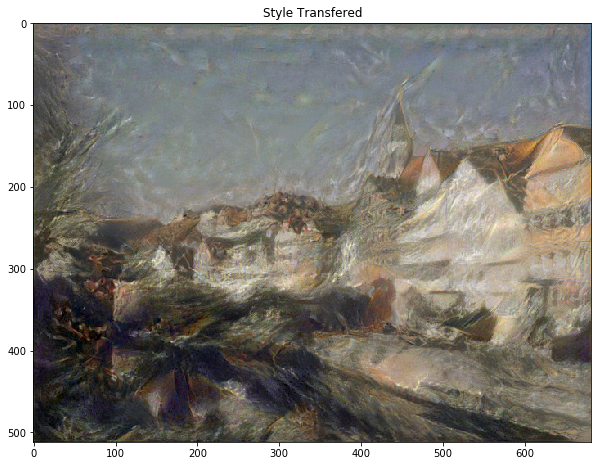

In [10]:
style_trans_simple_exp(model_dir, style_dir, content_dir, pool_mod='max',
                       style_name="the-shipwreck-of-the-minotaur.jpg", content_name="Tuebingen_Neckarfront.jpg")

Iteration: 50, loss: 802810496.000000
Iteration: 100, loss: 271662656.000000
Iteration: 150, loss: 144969280.000000
Iteration: 200, loss: 94445744.000000
Iteration: 250, loss: 70659520.000000
Iteration: 300, loss: 55857116.000000


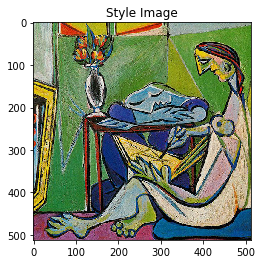

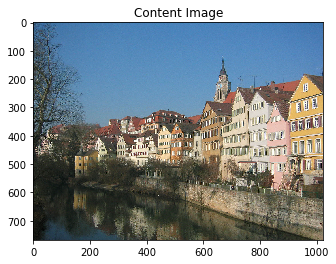

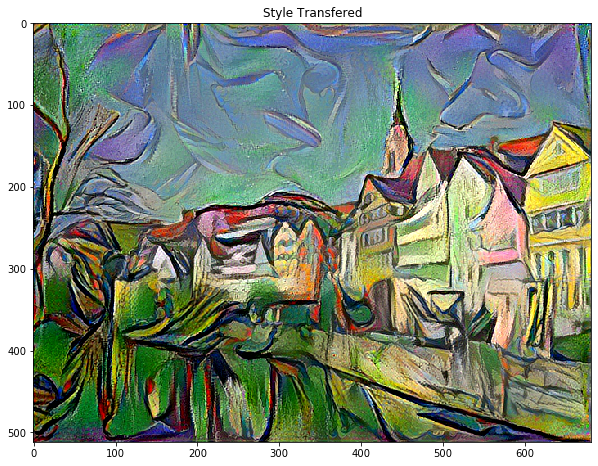

In [19]:
style_trans_simple_exp(model_dir, style_dir, content_dir, pool_mod='max',
                       style_name="la_muse.jpg", content_name="Tuebingen_Neckarfront.jpg")

# Exp 7 - Effect of layers and alpha-beta ratio

Time consumed: 21.524171829223633
Time consumed: 41.73282861709595
Time consumed: 62.062888383865356
Time consumed: 82.58591270446777
Time consumed: 102.59889674186707
Time consumed: 122.68106412887573
Time consumed: 142.6157898902893
Time consumed: 162.33675289154053
Time consumed: 182.858304977417
Time consumed: 203.1233389377594
Time consumed: 223.19587802886963
Time consumed: 243.20566082000732
Time consumed: 265.007248878479
Time consumed: 286.76148319244385
Time consumed: 308.703843832016
Time consumed: 330.71476554870605
Time consumed: 353.78433895111084
Time consumed: 376.89474534988403
Time consumed: 400.24414801597595
Time consumed: 423.3230550289154


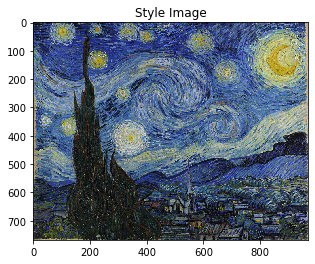

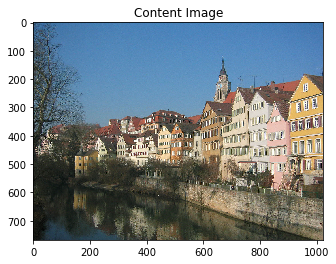

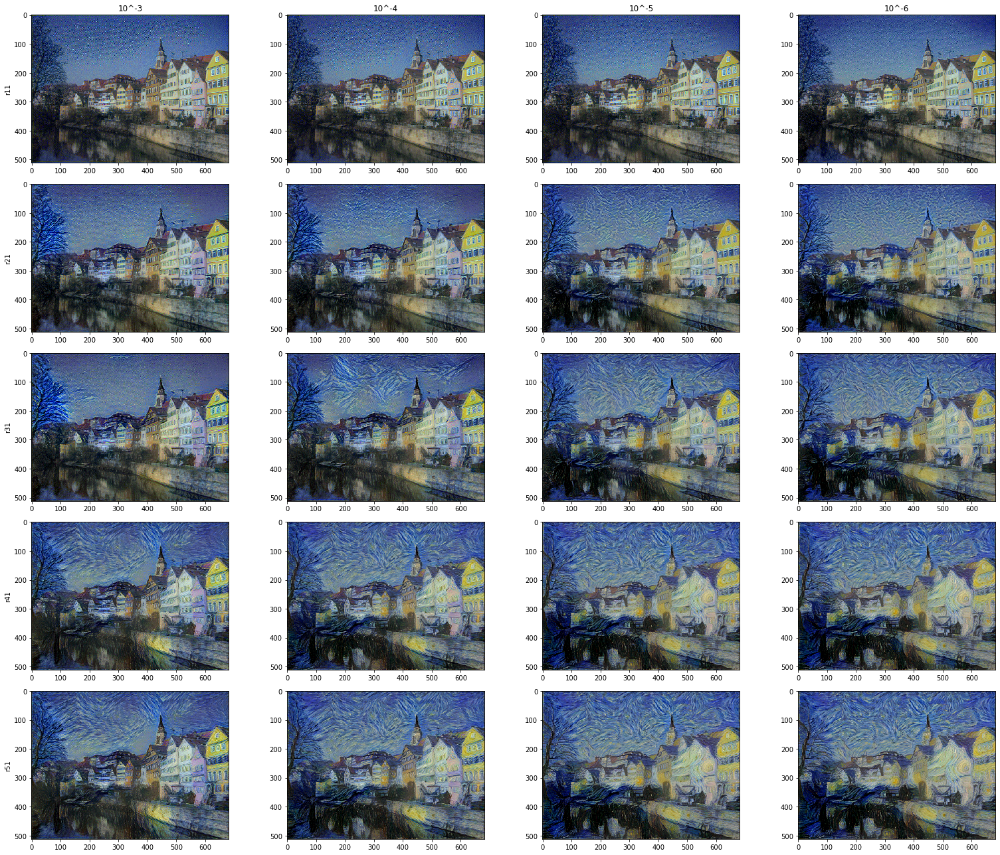

In [14]:
style_trans_compare_exp(model_dir, style_dir, content_dir, 
                        style_name="starry-night.jpg")